# ** 데이터 EDA와 데이터 정제 확인**

 15 종류의 사물 존재, 사물의 상태에 따라 이미지가 분류 되어 있다.
사물의 종류를 분류하고, 정상 샘플과 비정상(이상치) 샘플 분류

In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from google.colab import drive
import pandas as pd
import numpy as np
from tqdm import tqdm

pd.options.plotting.backend = 'plotly'

import plotly.io as pio
pio.renderers.default = "notebook_connected"

import matplotlib.pyplot as plt
import matplotlib.image as img
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_df = pd.read_csv("/content/drive/MyDrive/project/train_df.csv")
test_df = pd.read_csv("/content/drive/MyDrive/project/test_df.csv")

In [ ]:
display(train_df.shape, train_df.head())
display(test_df.shape,test_df.head())

(4277, 5)

,index,file_name,class,state,label
0,0,10000.png,transistor,good,transistor-good
1,1,10001.png,capsule,good,capsule-good
2,2,10002.png,transistor,good,transistor-good
3,3,10003.png,wood,good,wood-good
4,4,10004.png,bottle,good,bottle-good


(2154, 2)

,index,file_name
0,0,20000.png
1,1,20001.png
2,2,20002.png
3,3,20003.png
4,4,20004.png


Train 4,277개, Test 2,154개의 이미지
최종 예측해야 하는것은 class 와 state를 결합한 label

In [ ]:
print(f"class의 수: {len(train_df['class'].unique())}")
print(f"state의 수: {len(train_df['state'].unique())}")
print(f"label의 수: {len(train_df['label'].unique())}")

class의 수: 15
state의 수: 49
label의 수: 88


In [ ]:
colors = ['tomato', 'wheat','orange', 'teal', 'gold', 
  'thistle', 'lime', 'magenta', 'cyan', 
 'tan', 'bisque',  'violet', 'coral', 'Olive', 'chocolate']

data = train_df.groupby(['class']).size().sort_values(ascending=False).reset_index(name = 'cnt')

df_agg = train_df.groupby(['class', 'state']).size()
g = df_agg.groupby('class', group_keys=False)
df_agg = g.apply(lambda x: x.sort_values(ascending=False)).reset_index(name='cnt')
df_agg['state'] = np.where(df_agg['state'] == 'good', df_agg['class'], df_agg['state'])

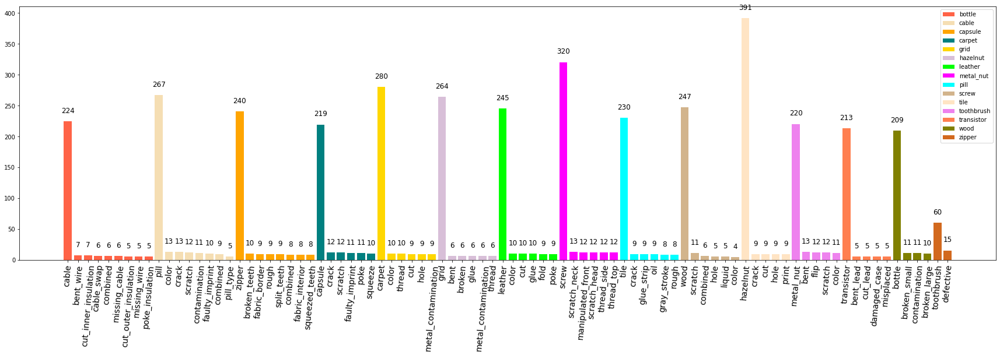

In [ ]:
f, axs = plt.subplots(1,1,figsize=(30,8))

i = 0
x_label = []
cnt_list = []

for c, color in zip(df_agg['class'].value_counts().index, colors):
  tmp = df_agg.loc[df_agg['class']==c]
  axs.bar(range(i, i+tmp.shape[0]), tmp['cnt'], color = color)
  
  i+= df_agg.loc[df_agg['class']==c].shape[0]
  x_label.extend(list(tmp['class'].unique())+ tmp['state'][1:].to_list())
  cnt_list.extend(tmp['cnt'].to_list())

for x, y in zip(list(range(len(df_agg))), cnt_list):
  axs.annotate('%d\n' %(int(y)), xy=(x,y), textcoords='data', ha = 'center', size = 12) 

axs.set_xticks(range(len(x_label)))
axs.set_xticklabels(x_label, rotation = 85, size = 14)
plt.legend(df_agg['class'].unique())
plt.show()

전체적으로 정상인 class별 정상인 물체가 비정상인 물체보다 더 많음

비정상의 종류가 상당히 많고, 각 state별 데이터 수가 매우 적다고 생각됨

cable의 경우 비정상인 state의 종류가 8가지이고 toothbrush의 경우는 비정상인 
경우는 1가지(defective)만 존재, 다른 class는 7~3경우의 비정상 종류가 존재

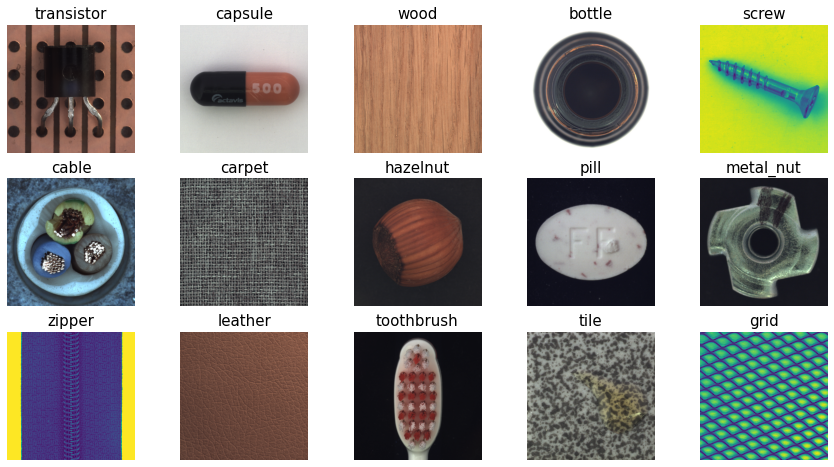

In [ ]:
fig, axs = plt.subplots(3, 5, figsize=(15, 8))

folder_dir = '/content/drive/MyDrive/project/train'

for i, current_class in enumerate(train_df['class'].unique()):
  image = img.imread(folder_dir+"/"+ train_df.loc[train_df['class'] == current_class]['file_name'].sample(1).iloc[0])
  axs[i//5, i%5].imshow(image)
  axs[i//5, i%5].set_title(current_class, fontsize=15)
  axs[i//5, i%5].axis('off')
plt.show()

class별 이미지가 눈에 확 다르기 때문에 모델이 class 자체를 잘못 예측하지는 않지 않을까...? 막연한 생각

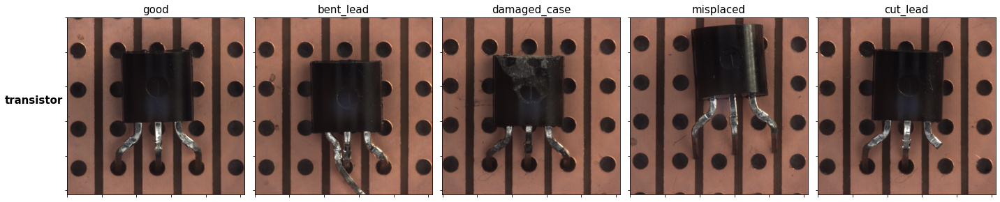

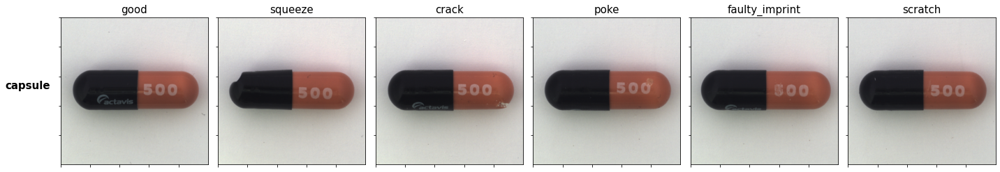

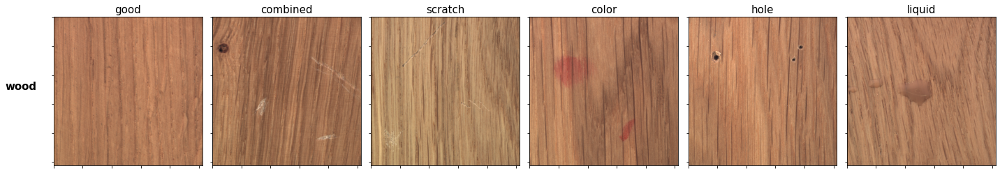

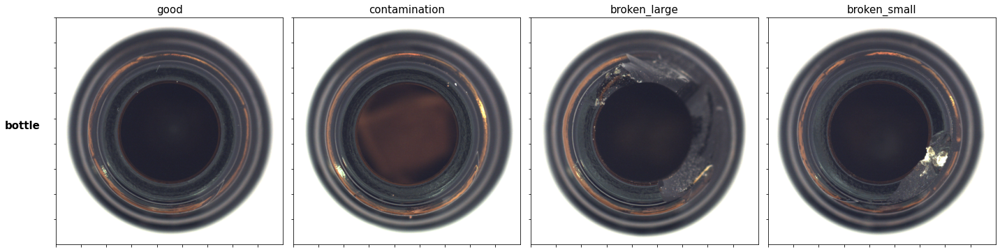

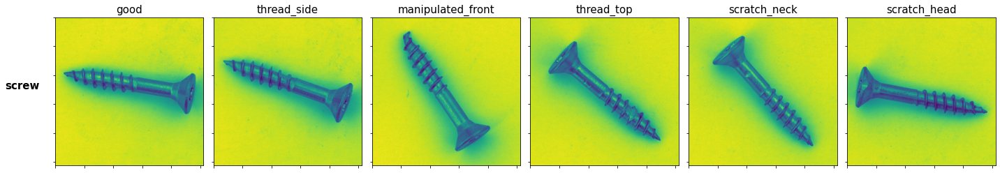

...

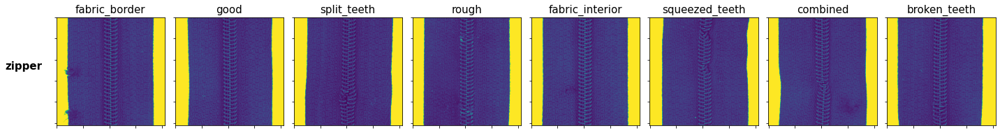

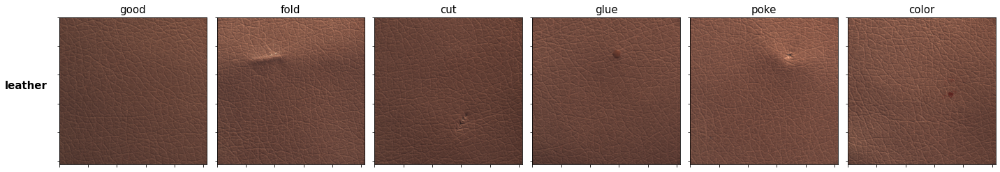

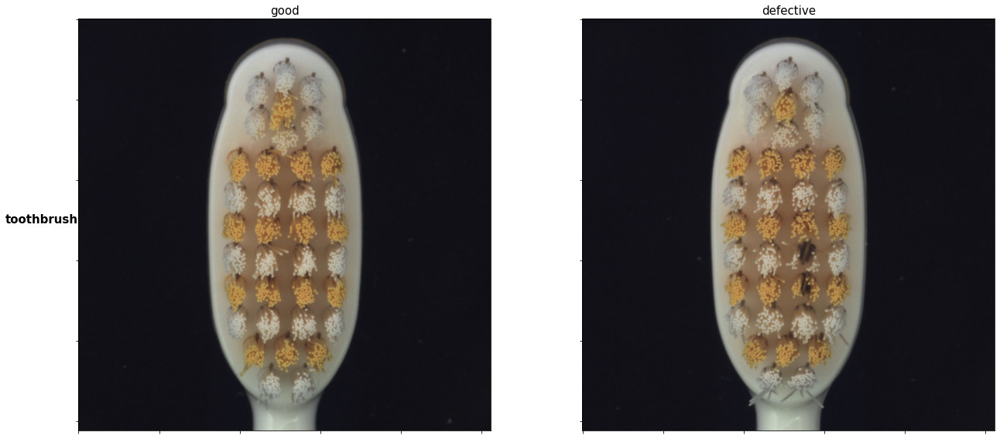

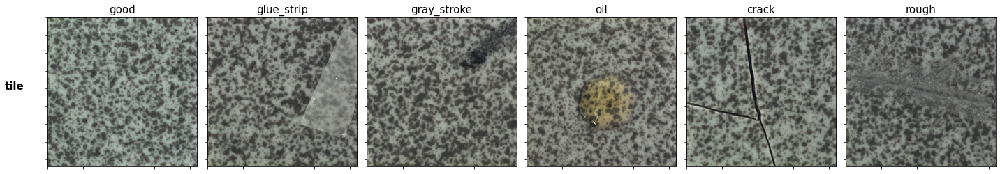

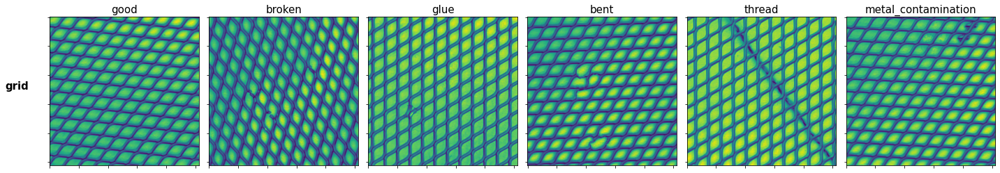

In [ ]:
folder_dir ='/content/drive/MyDrive/project/train'

for current_class in train_df['class'].unique():
  tmp = train_df.loc[train_df['class'] == current_class]
  states = train_df.loc[train_df['class'] == current_class, 'state'].unique()

  fig, axs = plt.subplots(1, len(states), figsize=(20, 8))
 
  for col_idx, state in enumerate(states):
    img_dir = tmp.loc[tmp['state'] == state, 'file_name'].sample(1).iloc[0]
    image = img.imread(folder_dir + '/' + img_dir)
    axs[col_idx].imshow(image)
    axs[col_idx].set_xticklabels([])
    axs[col_idx].set_yticklabels([])

  for ax, col in zip(axs, states):
    ax.set_title(col, size = 15)

  axs[0].set_ylabel(current_class, rotation=0, fontsize=15, labelpad=40, fontdict=dict(weight='bold'))

  fig.tight_layout()
  # plt.suptitle(mask_state,fontsize=25, y=1.04)
  plt.show()
  print('\n\n')

이미지증강을 적용할 때 label의 혼돈을 주지 않기 위해 적절한 이미지 증강을 적용해야 할것 같다.


In [ ]:
train_df['width'] = np.nan
train_df['height'] = np.nan
train_df['channel'] = np.nan

test_df['width'] = np.nan
test_df['height'] = np.nan
test_df['channel'] = np.nan

In [ ]:
for i in tqdm(range(len(train_df))):
    image = img.imread('/content/drive/MyDrive/project/train' + '/' + train_df['file_name'].loc[i])
    if len(image.shape) == 2:
      w, h = image.shape
      c = 1
    else:
      w, h, c = image.shape
    train_df.loc[i, 'width'] = w
    train_df.loc[i, 'height'] = h
    train_df.loc[i, 'channel'] = c

# for i in tqdm(range(len(test_df))):
#     image = img.imread('/content/drive/MyDrive/project/train' + '/' + test_df['file_name'].loc[i])
#     if len(image.shape) == 2:
#       w, h = image.shape
#       c = 1
#     else:
#       w, h, c = image.shape
#     test_df.loc[i, 'width'] = w
#     test_df.loc[i, 'height'] = h
#     test_df.loc[i, 'channel'] = c

In [ ]:
(train_df['width']/train_df['height']).unique(), (test_df['width']/test_df['height']).unique()

(array([1.]), array([nan]))

In [ ]:
tmp = train_df.groupby('class')['width'].unique().reset_index(name = 'width')
display(tmp)

print('\n')
tmp ['width'] = tmp['width'].apply(lambda x: x[0])
for v in train_df['width'].unique():
  print(f'image size {int(v):,} x {int(v):,}:', tmp.loc[tmp['width'] == v, 'class'].to_list())

,class,width
0,bottle,[900.0]
1,cable,[1024.0]
2,capsule,[1000.0]
3,carpet,[1024.0]
4,grid,[1024.0]
5,hazelnut,[1024.0]
6,leather,[1024.0]
7,metal_nut,[700.0]
8,pill,[800.0]
9,screw,[1024.0]




image size 1,024 x 1,024: ['cable', 'carpet', 'grid', 'hazelnut', 'leather', 'screw', 'toothbrush', 'transistor', 'wood', 'zipper']
image size 1,000 x 1,000: ['capsule']
image size 900 x 900: ['bottle']
image size 800 x 800: ['pill']
image size 700 x 700: ['metal_nut']
image size 840 x 840: ['tile']


capsule 의 경우 이미지의 크기가 1,000 x 1,000

bottle의 경우 이미지의 크기가 900 x 900

pill의 경우 이미지의 크기가 800 x 800

metal_nut의 경우 이미지의 크기가 700 x 700

tile의 경우 이미지의 크기가 840 x 840

나머지의 경우 1024 x 1024의 이미지 크기를 갖는다.
class image channel

In [ ]:
tmp = train_df.groupby('class')['channel'].unique().reset_index(name = 'channel')
display(tmp)

print('\n')
tmp ['channel'] = tmp['channel'].apply(lambda x: x[0])
for v in train_df['channel'].unique():
  print(f'image channel {int(v):,}:', tmp.loc[tmp['channel'] == v, 'class'].to_list())

,class,channel
0,bottle,[3.0]
1,cable,[3.0]
2,capsule,[3.0]
3,carpet,[3.0]
4,grid,[1.0]
5,hazelnut,[3.0]
6,leather,[3.0]
7,metal_nut,[3.0]
8,pill,[3.0]
9,screw,[1.0]




image channel 3: ['bottle', 'cable', 'capsule', 'carpet', 'hazelnut', 'leather', 'metal_nut', 'pill', 'tile', 'toothbrush', 'transistor', 'wood']
image channel 1: ['grid', 'screw', 'zipper']


grid, screw, zipper의 경우 이미지가 흑백

나머지는 다 3개의 channel을 갖는 이미지

EDA 결론

1. label의 수는 많지만 비정상인 label의 이미지 수가 매우 적다.

2. 각 class별 state 수가 많게는 7개 적게는 1개 이고, state를 공유하는 class가 존재

3. 이미지 증강시 상태를 고려해서 잘 적용해야 할 것

4. 모든 이미지는 높이, 넓이 동일하고, 클래스별 고유의 이미지 크기를 갖는 클래스 존재
흑백인 이미지가 존재한다.

# **모델 설정 (PYTORCH)**

In [ ]:
! pip install timm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 509 kB 14.6 MB/s 


In [ ]:
import warnings
warnings.filterwarnings('ignore')

from glob import glob
import cv2

import os
import timm
import random

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torchvision.transforms as transforms
from sklearn.metrics import f1_score, accuracy_score
import time

from sklearn.model_selection import StratifiedKFold
device = torch.device('cuda')

In [ ]:
path = '/content/drive/MyDrive/project/'

In [ ]:
train_png = sorted(glob(path + 'train/*.png'))
test_png = sorted(glob(path + 'test/*.png'))

In [ ]:
len(train_png), len(test_png)

(4277, 2154)

In [ ]:
train_y = pd.read_csv(path +"train_df.csv")

train_labels = train_y["label"]

label_unique = sorted(np.unique(train_labels))
label_unique = {key:value for key,value in zip(label_unique, range(len(label_unique)))}

train_labels = [label_unique[k] for k in train_labels]


In [ ]:
def img_load(path):
    img = cv2.imread(path)[:,:,::-1]
    img = cv2.resize(img, (384, 384),interpolation = cv2.INTER_AREA)
    return img

In [ ]:
train_imgs = [img_load(m) for m in tqdm(train_png)]
test_imgs = [img_load(n) for n in tqdm(test_png)]

100%|██████████| 2154/2154 [38:38<00:00,  1.08s/it]


In [ ]:
np.save(path + 'train_imgs_384', np.array(train_imgs))
np.save(path + 'test_imgs_384', np.array(test_imgs))

In [ ]:
train_imgs = np.load(path + 'train_imgs_384.npy')
test_imgs = np.load(path + 'test_imgs_384.npy')

In [ ]:
meanRGB = [np.mean(x, axis=(0,1)) for x in train_imgs]
stdRGB = [np.std(x, axis=(0,1)) for x in train_imgs]

meanR = np.mean([m[0] for m in meanRGB])/255
meanG = np.mean([m[1] for m in meanRGB])/255
meanB = np.mean([m[2] for m in meanRGB])/255

stdR = np.mean([s[0] for s in stdRGB])/255
stdG = np.mean([s[1] for s in stdRGB])/255
stdB = np.mean([s[2] for s in stdRGB])/255

print("train 평균",meanR, meanG, meanB)
print("train 표준편차",stdR, stdG, stdB)

train 평균 0.4330380901867049 0.4034575319032911 0.39415050509784405
train 표준편차 0.1815717110252788 0.17403455556798705 0.16323395055036488


In [ ]:
meanRGB = [np.mean(x, axis=(0,1)) for x in test_imgs]
stdRGB = [np.std(x, axis=(0,1)) for x in test_imgs]

meanR = np.mean([m[0] for m in meanRGB])/255
meanG = np.mean([m[1] for m in meanRGB])/255
meanB = np.mean([m[2] for m in meanRGB])/255

stdR = np.mean([s[0] for s in stdRGB])/255
stdG = np.mean([s[1] for s in stdRGB])/255
stdB = np.mean([s[2] for s in stdRGB])/255

print("test 평균",meanR, meanG, meanB)
print("test 표준편차",stdR, stdG, stdB)

test 평균 0.41825619520929724 0.3931011906330291 0.386631764639131
test 표준편차 0.19505524270747931 0.19005280951759498 0.18053225852732663


In [ ]:
class Custom_dataset(Dataset):
    def __init__(self, img_paths, labels, mode='train'):
        self.img_paths = img_paths
        self.labels = labels
        self.mode=mode
    def __len__(self):
        return len(self.img_paths)
    def __getitem__(self, idx):
        img = self.img_paths[idx]
        if self.mode == 'train':
          train_transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean = [0.433038, 0.403458, 0.394151],
                                     std = [0.181572, 0.174035, 0.163234]),
                transforms.RandomAffine((-45, 45)),
                
            ])
          img = train_transform(img)
        if self.mode == 'test':
          test_transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean = [0.418256, 0.393101, 0.386632],
                                     std = [0.195055, 0.190053, 0.185323])
            ])
          img = test_transform(img)

        
        label = self.labels[idx]
        return img, label
    
class Network(nn.Module):
    def __init__(self,mode = 'train'):
        super(Network, self).__init__()
        self.mode = mode
        if self.mode == 'train':
          self.model = timm.create_model('efficientnet_b3', pretrained=True, num_classes=88, drop_path_rate = 0.2)
        if self.mode == 'test':
          self.model = timm.create_model('efficientnet_b3', pretrained=True, num_classes=88, drop_path_rate = 0)
        
    def forward(self, x):
        x = self.model(x)
        return x

In [ ]:
def score_function(real, pred):
    score = f1_score(real, pred, average="macro")
    return score

In [ ]:
def main(seed = 2022):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True
    
main(2022)


In [ ]:
import gc

cv = StratifiedKFold(n_splits = 5, random_state = 2022,shuffle=True)
batch_size = 32
epochs = 70
pred_ensemble = []


for idx, (train_idx, val_idx) in enumerate(cv.split(train_imgs, np.array(train_labels))):
  print("----------fold_{} start!----------".format(idx))
  t_imgs, val_imgs = train_imgs[train_idx],  train_imgs[val_idx]
  t_labels, val_labels = np.array(train_labels)[train_idx], np.array(train_labels)[val_idx]

  # Train
  train_dataset = Custom_dataset(np.array(t_imgs), np.array(t_labels), mode='train')
  train_loader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)

  # Val
  val_dataset = Custom_dataset(np.array(val_imgs), np.array(val_labels), mode='test')
  val_loader = DataLoader(val_dataset, shuffle=True, batch_size=batch_size)

  gc.collect()
  torch.cuda.empty_cache()
  best=0

  model = Network().to(device)

  optimizer = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay = 2e-2)
  criterion = nn.CrossEntropyLoss()
  scaler = torch.cuda.amp.GradScaler()  

  best_f1 = 0
  early_stopping = 0
  for epoch in range(epochs):
    start=time.time()
    train_loss = 0
    train_pred=[]
    train_y=[]
    model.train()
    for batch in (train_loader):
        optimizer.zero_grad()
        x = torch.tensor(batch[0], dtype=torch.float32, device=device)
        y = torch.tensor(batch[1], dtype=torch.long, device=device)
        with torch.cuda.amp.autocast():
            pred = model(x)
        loss = criterion(pred, y)


        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        train_loss += loss.item()/len(train_loader)
        train_pred += pred.argmax(1).detach().cpu().numpy().tolist()
        train_y += y.detach().cpu().numpy().tolist()
    train_f1 = score_function(train_y, train_pred)
    state_dict= model.state_dict()
    model.eval()
    with torch.no_grad():
      val_loss = 0 
      val_pred = []
      val_y = []
      

      for batch in (val_loader):
        x_val = torch.tensor(batch[0], dtype = torch.float32, device = device)
        y_val = torch.tensor(batch[1], dtype=torch.long, device=device)
        with torch.cuda.amp.autocast():
            pred_val = model(x_val)
        loss_val = criterion(pred_val, y_val)

        val_loss += loss_val.item()/len(val_loader)
        val_pred += pred_val.argmax(1).detach().cpu().numpy().tolist()
        val_y += y_val.detach().cpu().numpy().tolist()
      val_f1 = score_function(val_y, val_pred)

      if val_f1 > best_f1:
        best_epoch = epoch
        best_loss = val_loss
        best_f1 = val_f1
        early_stopping = 0

        torch.save({'epoch':epoch,
                    'state_dict':state_dict,
                    'optimizer': optimizer.state_dict(),
                    'scaler': scaler.state_dict(),
             }, path +'best_model_{}.pth'.format(idx))
        print('-----------------SAVE:{} epoch----------------'.format(best_epoch+1))
      else:
          early_stopping += 1

            # Early Stopping
      if early_stopping == 20:
        TIME = time.time() - start
        print(f'epoch : {epoch+1}/{epochs}    time : {TIME:.0f}s/{TIME*(epochs-epoch-1):.0f}s')
        print(f'TRAIN    loss : {train_loss:.5f}    f1 : {train_f1:.5f}')
        print(f'Val    loss : {val_loss:.5f}    f1 : {val_f1:.5f}')
        break

    TIME = time.time() - start
    print(f'epoch : {epoch+1}/{epochs}    time : {TIME:.0f}s/{TIME*(epochs-epoch-1):.0f}s')
    print(f'TRAIN    loss : {train_loss:.5f}    f1 : {train_f1:.5f}')
    print(f'Val    loss : {val_loss:.5f}    f1 : {val_f1:.5f}')

----------fold_0 start!----------


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/efficientnet_b3_ra2-cf984f9c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_ra2-cf984f9c.pth


-----------------SAVE:1 epoch----------------
epoch : 1/70    time : 98s/6735s
TRAIN    loss : 1.18217    f1 : 0.18602
Val    loss : 0.62392    f1 : 0.25515
-----------------SAVE:2 epoch----------------
epoch : 2/70    time : 85s/5772s
TRAIN    loss : 0.55781    f1 : 0.36254
Val    loss : 0.46202    f1 : 0.40135
-----------------SAVE:3 epoch----------------
epoch : 3/70    time : 85s/5695s
TRAIN    loss : 0.39057    f1 : 0.50539
Val    loss : 0.33345    f1 : 0.54776
-----------------SAVE:4 epoch----------------
epoch : 4/70    time : 85s/5592s
TRAIN    loss : 0.28296    f1 : 0.63629
Val    loss : 0.34920    f1 : 0.59115
-----------------SAVE:5 epoch----------------
epoch : 5/70    time : 85s/5524s
TRAIN    loss : 0.24075    f1 : 0.69078
Val    loss : 0.22450    f1 : 0.64434
-----------------SAVE:6 epoch----------------
epoch : 6/70    time : 85s/5416s
TRAIN    loss : 0.16239    f1 : 0.79470
Val    loss : 0.20053    f1 : 0.69671
epoch : 7/70    time : 85s/5333s
TRAIN    loss : 0.12453  

In [ ]:
pred_ensemble = []
batch_size = 32
# Test
test_dataset = Custom_dataset(np.array(test_imgs), np.array(["tmp"]*len(test_imgs)), mode='test')
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

for i in range(5):
  model_test = Network(mode = 'test').to(device)
  model_test.load_state_dict(torch.load((path+'best_model_{}.pth'.format(i)))['state_dict'])
  model_test.eval()
  pred_prob = []
  with torch.no_grad():
      for batch in (test_loader):
          x = torch.tensor(batch[0], dtype = torch.float32, device = device)
          with torch.cuda.amp.autocast():
              pred = model_test(x)
              pred_prob.extend(pred.detach().cpu().numpy())
      pred_ensemble.append(pred_prob)

In [ ]:
len(pred_ensemble)

5

In [ ]:
pred = (np.array(pred_ensemble[0])+ np.array(pred_ensemble[1])+ np.array(pred_ensemble[3]) + np.array(pred_ensemble[4]) )/4
f_pred = np.array(pred).argmax(1).tolist()

In [ ]:
label_decoder = {val:key for key, val in label_unique.items()}

f_result = [label_decoder[result] for result in f_pred]

In [ ]:
submission = pd.read_csv(path + "/sample_submission.csv")

submission["label"] = f_result

submission

,index,label
0,0,tile-glue_strip
1,1,grid-good
2,2,transistor-good
3,3,tile-gray_stroke
4,4,tile-good
...,...,...
2149,2149,tile-gray_stroke
2150,2150,screw-good
2151,2151,grid-good
2152,2152,cable-good


In [ ]:
submission.to_csv(path + "b3_norm_epoch70_4_2.csv", index = False)

In [ ]:
batch_size = 32
epochs = 30

# Train
train_dataset = Custom_dataset(np.array(train_imgs), np.array(train_labels), mode='train')
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)

# Test
test_dataset = Custom_dataset(np.array(test_imgs), np.array(["tmp"]*len(test_imgs)), mode='test')
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
def score_function(real, pred):
    score = f1_score(real, pred, average="macro")
    return score

model = Network().to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5, weight_decay = 1e-3)
criterion = nn.CrossEntropyLoss()
scaler = torch.cuda.amp.GradScaler() 

batch_size = 32
epochs = 30

best=0
for epoch in range(epochs):
    start=time.time()
    train_loss = 0
    train_pred=[]
    train_y=[]
    model.train()
    for batch in (train_loader):
        optimizer.zero_grad()
        x = torch.tensor(batch[0], dtype=torch.float32, device=device)
        y = torch.tensor(batch[1], dtype=torch.long, device=device)
        with torch.cuda.amp.autocast():
            pred = model(x)
        loss = criterion(pred, y)


        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        train_loss += loss.item()/len(train_loader)
        train_pred += pred.argmax(1).detach().cpu().numpy().tolist()
        train_y += y.detach().cpu().numpy().tolist()
        
    
    train_f1 = score_function(train_y, train_pred)

    TIME = time.time() - start
    print(f'epoch : {epoch+1}/{epochs}    time : {TIME:.0f}s/{TIME*(epochs-epoch-1):.0f}s')
    print(f'TRAIN    loss : {train_loss:.5f}    f1 : {train_f1:.5f}')

epoch : 1/30    time : 99s/2870s
TRAIN    loss : 1.64291    f1 : 0.14841
epoch : 2/30    time : 98s/2745s
TRAIN    loss : 0.78966    f1 : 0.17214
epoch : 3/30    time : 98s/2644s
TRAIN    loss : 0.60063    f1 : 0.28305
epoch : 4/30    time : 98s/2549s
TRAIN    loss : 0.48486    f1 : 0.39416
epoch : 5/30    time : 98s/2451s
TRAIN    loss : 0.40037    f1 : 0.44821
epoch : 6/30    time : 98s/2353s
TRAIN    loss : 0.33195    f1 : 0.54748
epoch : 7/30    time : 98s/2253s
TRAIN    loss : 0.28580    f1 : 0.60906
epoch : 8/30    time : 98s/2151s
TRAIN    loss : 0.24963    f1 : 0.66778
epoch : 9/30    time : 98s/2053s
TRAIN    loss : 0.20440    f1 : 0.73056
epoch : 10/30    time : 98s/1959s
TRAIN    loss : 0.18004    f1 : 0.76590
epoch : 11/30    time : 98s/1859s
TRAIN    loss : 0.16133    f1 : 0.79510
epoch : 12/30    time : 98s/1762s
TRAIN    loss : 0.13391    f1 : 0.84488
epoch : 13/30    time : 98s/1664s
TRAIN    loss : 0.11674    f1 : 0.84974
epoch : 14/30    time : 98s/1564s
TRAIN    loss

In [ ]:
model.eval()
f_pred = []
pred_prob = []

with torch.no_grad():
    for batch in (test_loader):
        x = torch.tensor(batch[0], dtype = torch.float32, device = device)
        with torch.cuda.amp.autocast():
            pred = model(x)
            pred_prob.extend(pred.detach().cpu().numpy())
        f_pred.extend(pred.argmax(1).detach().cpu().numpy().tolist())

In [ ]:
label_decoder = {val:key for key, val in label_unique.items()}

f_result = [label_decoder[result] for result in f_pred]
f_result

['tile-glue_strip',
 'grid-good',
 'transistor-good',
 'tile-gray_stroke',
 'tile-good',
 'pill-crack',
 'capsule-faulty_imprint',
 'hazelnut-cut',
 'leather-good',
 'leather-glue',
 'bottle-broken_large',
 'wood-good',
 'zipper-rough',
 'screw-thread_top',
 'tile-glue_strip',
 'bottle-contamination',
 'grid-bent',
 'carpet-hole',
 'carpet-good',
 'pill-color',
 'tile-rough',
 'zipper-good',
 'bottle-broken_large',
 'screw-scratch_neck',
 'pill-faulty_imprint',
 'screw-good',
 'pill-faulty_imprint',
 'screw-thread_top',
 'leather-good',
 'wood-liquid',
 'screw-good',
 'cable-good',
 'screw-thread_side',
 'zipper-combined',
 'zipper-good',
 'zipper-fabric_border',
 'leather-good',
 'cable-good',
 'leather-cut',
 'metal_nut-flip',
 'metal_nut-good',
 'cable-good',
 'screw-thread_top',
 'capsule-faulty_imprint',
 'metal_nut-flip',
 'tile-good',
 'toothbrush-good',
 'capsule-good',
 'zipper-good',
 'screw-good',
 'cable-good',
 'transistor-good',
 'hazelnut-crack',
 'hazelnut-print',
 'zip